# Introducción

- Alumna: Abril Nazarena Rodriguez

- Legajo: R-4582/9

- Asignatura: Procesamiento de Imágenes y Visión por Computadora

El presente notebook consta de la resolución del ejercicio 9 de la práctica de la unidad 1 de la materia.

# Librerías

In [2]:
%%capture
# Instalación de paquetes
!pip install pixellib torchvision ultralytics transformers timm
!pip install ultralytics==8.0.196

# Importación de bibliotecas
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt
from ultralytics import YOLO
from transformers import pipeline
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display
from pixellib.torchbackend.instance import instanceSegmentation
from torchvision import transforms
import ultralytics
import sys

# Limpieza de salida en el notebook
from IPython import display
display.clear_output()

El objetivo de este ejercicio es aplicar los algoritmos de segmentación propuestos en clase sobre distintas fotografías con objetos, con el fin de observar los resultados y comentar las diferencias.

Comenzaré cargando en la variable '*imagenes*' una lista con las imágenes que tomé de distintos objetos que encontré en mi casa.

In [3]:
imagenes = ['auricular_solo.jpeg', 'auricular_objetos.jpeg', 'auricular_oculto1.jpeg', 'auricular_oculto2.jpeg', 'auricular_oculto3.jpeg']

# Watershed (OpenCV)

Primero, probaré el método Watershed de OpenCV mediante la función '**Watershed**' que definí a continuación.

In [4]:
def Watershed(imagen):
    '''Recibe una imagen y aplica el método Watershed de OpenCV para segmentar los objetos en ella'''
    output_image = "watershed_" + imagen
    img = cv2.imread(imagen)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  # Convertir a escala de grises
    blur = cv2.GaussianBlur(gray, (5, 5), 0)  # Aplicar desenfoque gaussiano

    _, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU) # Binarizar la imagen

    kernel = np.ones((3,3), np.uint8) # Crear un kernel 3x3
    opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2) # Aplicar operaciones morfológicas

    sure_bg = cv2.dilate(opening, kernel, iterations=3) # Determinar el área segura del fondo

    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5) # Encontrar el área segura del primer plano
    _, sure_fg = cv2.threshold(dist_transform, 0.7*dist_transform.max(), 255, 0)

    # Encontrar la región desconocida
    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, sure_fg)

    # Etiquetar los marcadores
    _, markers = cv2.connectedComponents(sure_fg)

    # Añadir uno a todos los marcadores para asegurar que el fondo sea 1 en lugar de 0
    markers = markers+1

    # Marcar la región desconocida con cero
    markers[unknown==255] = 0

    # Aplicar el algoritmo Watershed
    markers = cv2.watershed(img, markers)
    img[markers == -1] = [0, 255, 0]

    # Visualizar el resultado
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))  # dos columnas: una para mostrar la imagen original y otra para mostrar su resultado segmentado

    axs[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axs[0].set_title("Imagen original")
    axs[0].axis('off')

    axs[1].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axs[1].set_title("Imagen resultado")
    axs[1].axis('off')

    plt.tight_layout()
    plt.show()

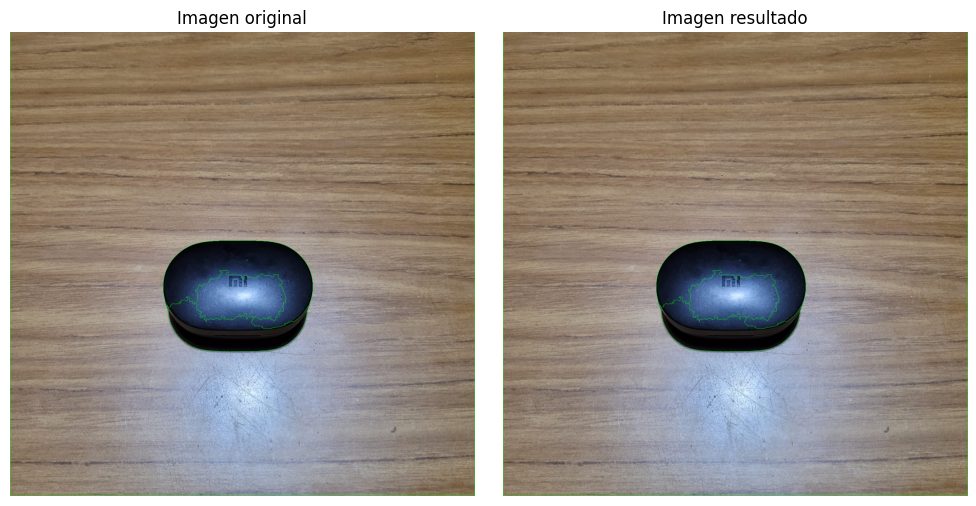

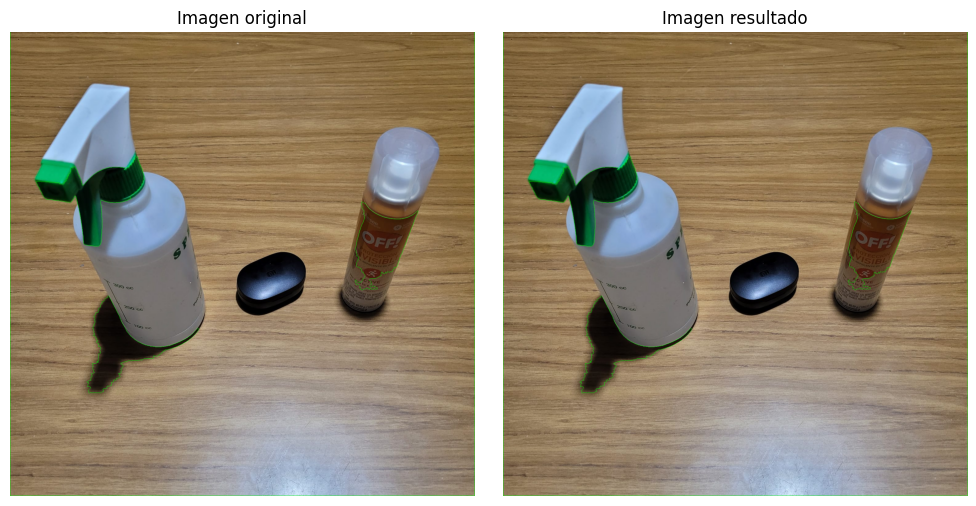

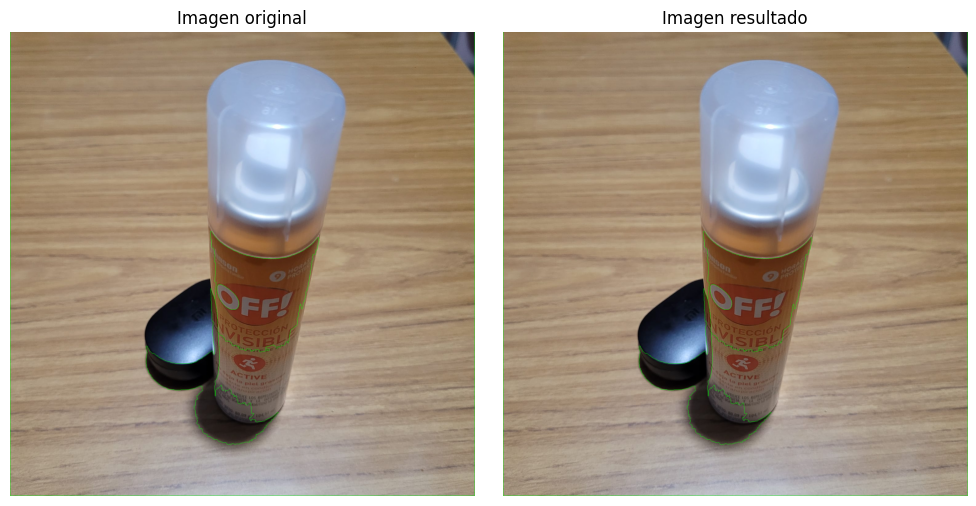

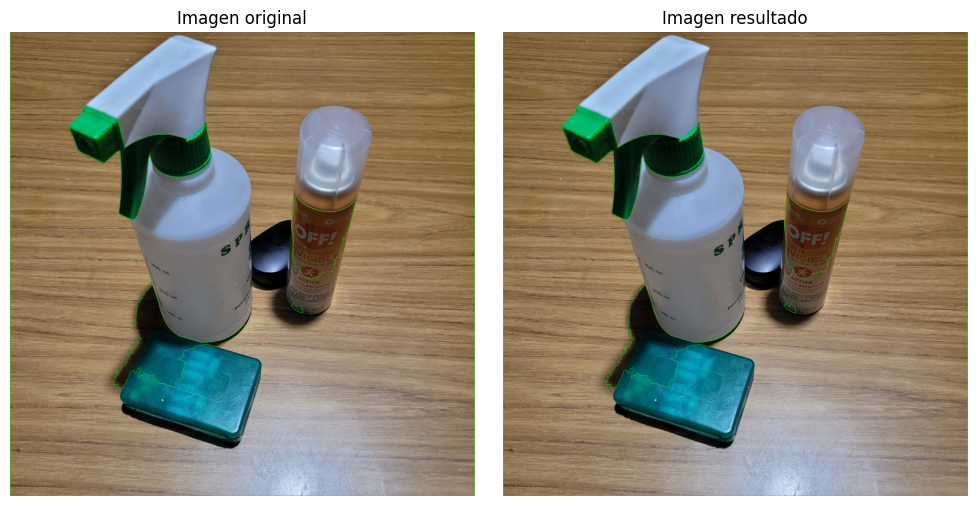

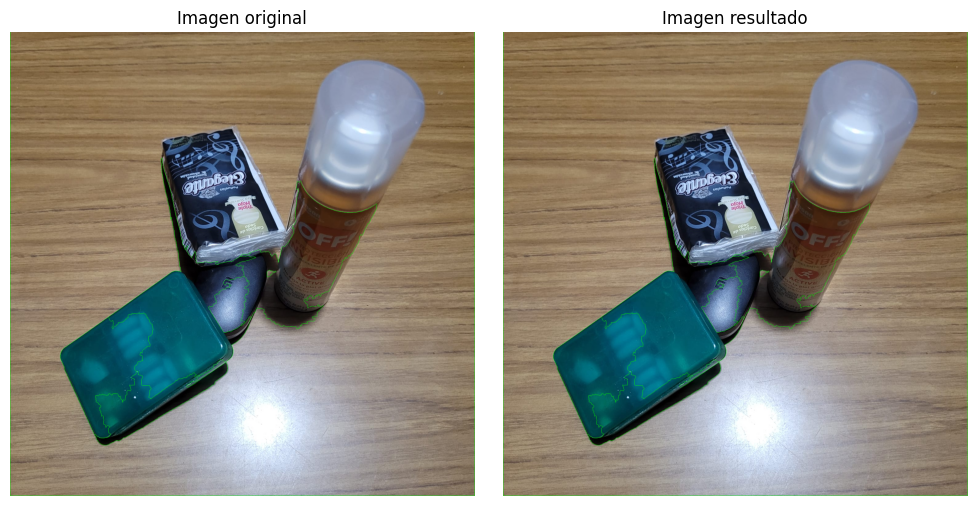

In [5]:
for imagen in imagenes:
  Watershed(imagen)

Este método de segmentación es susceptible a los reflejos y sombras. Se puede observar que en todas las imágenes, no logra segmentar correctamente los objetos debido a que confunde los reflejos y las sombras producidas por la lámpara.

#PointRend Resnet50 (PixelLib)

El segundo modelo que aplicaré es PointRend Resnet50 de PixelLib. Para ello, primero descargué el modelo, y luego definí la función '**point_rend**' para poder aplicarlo.

In [6]:
# Instance segmentation model
%%capture
!wget "https://github.com/ayoolaolafenwa/PixelLib/releases/download/0.2.0/pointrend_resnet50.pkl" -O pointrend_resnet50.pkl

In [9]:
def point_rend(i, imagen):
    '''Recibe una imagen y segmenta los objetos en ella según el modelo PointRend Resnet50'''
    output_image = "point_rend_" + imagen
    ins.segmentImage(imagen, show_bboxes=True, output_image_name=output_image) # segmentar la imagen
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))  # dos columnas: una para mostrar la imagen original y otra su resultado segmentado

    axs[0].imshow(plt.imread(imagen))
    axs[0].set_title("Imagen " + str(i+1) + " original")
    axs[0].axis('off')

    axs[1].imshow(plt.imread(output_image))
    axs[1].set_title("Imagen " + str(i+1) + " resultado")
    axs[1].axis('off')

    plt.tight_layout()
    plt.show()

A continuación, creé una instancia del modelo, lo cargué y llamé a la función mediante un ciclo for para visualizar los resultados en todas las imágenes.

  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}
/usr/local/lib/python3.10/dist-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


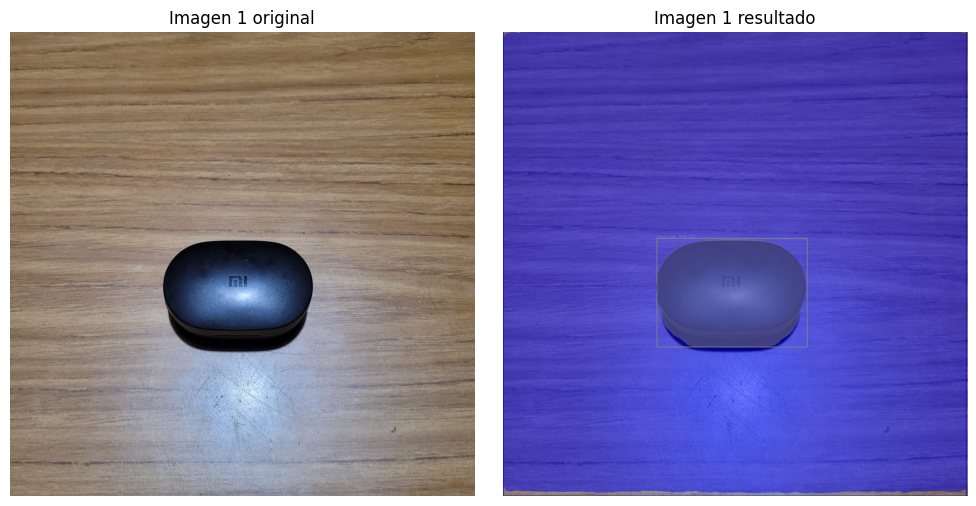

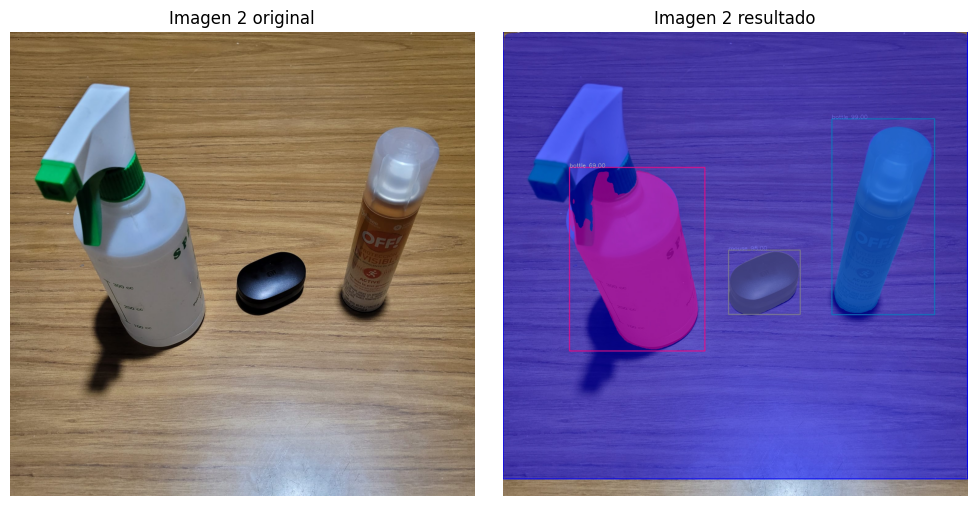

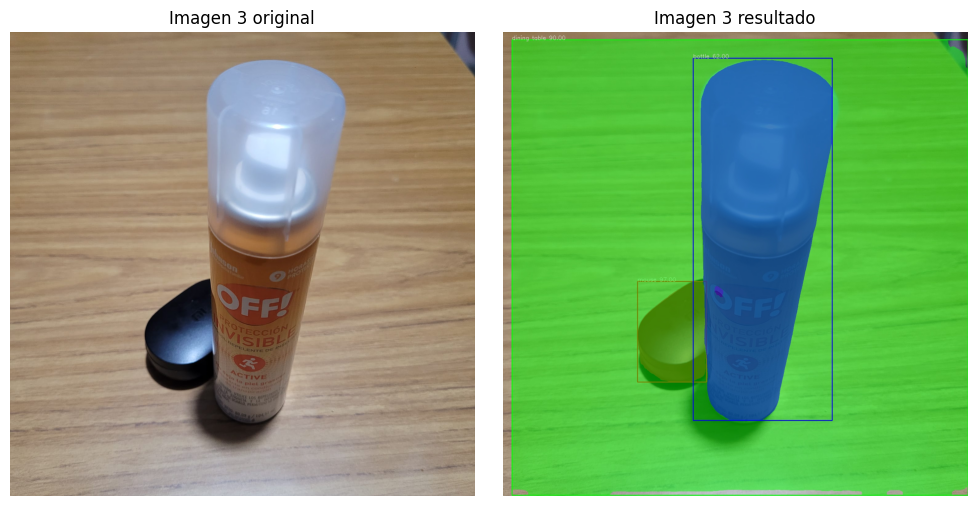

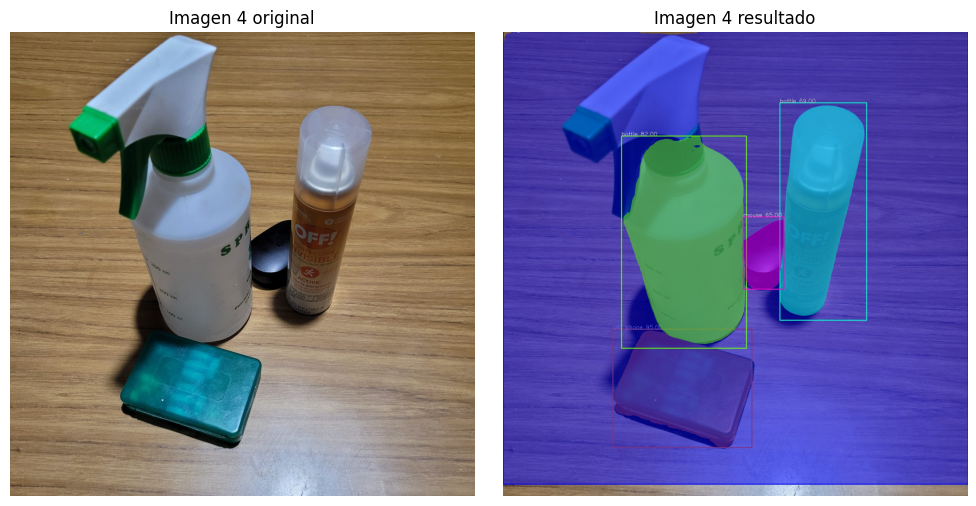

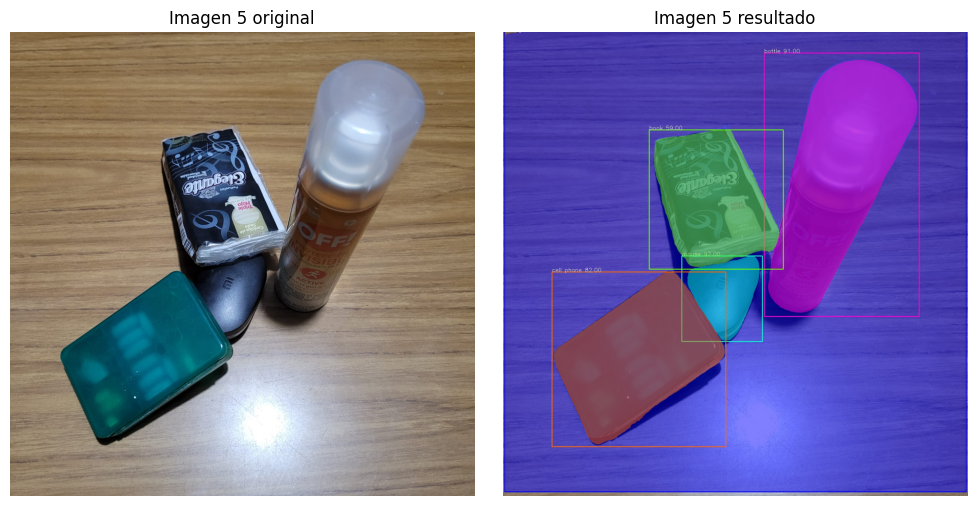

In [10]:
ins = instanceSegmentation()
ins.load_model("pointrend_resnet50.pkl")  # cargar modelo

for i, imagen in enumerate(imagenes):
  point_rend(i, imagen)

El modelo de PixLib es capaz de segmentar correctamente los objetos (a excepción del spray), aún cuando se encuentran solapados. Si bien las etiquetas no fueron las correctas, es entendible porque los objetos que elegí para las fotos no son demasiado comunes (caja de auriculares, pastillero, etc).

#DeepLabV3 (Torchvision)

El tercer modelo de segmentación que probaré es DeepLabV3, de Torchvision.

Para ello, descargué el modelo y definí la función 'DeepLabV3', la cual recibe una imagen y se encarga de aplicar el modelo.

In [11]:
%%capture
model = torch.hub.load('pytorch/vision:v0.10.0', 'deeplabv3_resnet50', pretrained=True)
model.eval()

In [12]:
def DeepLabV3(imagen):
    '''Recibe una imagen y segmenta los objetos en ella según el modelo de DeepLabV3 '''
    input_image = Image.open(imagen).convert("RGB").convert("RGB")
    preprocess = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

    input_tensor = preprocess(input_image)
    input_batch = input_tensor.unsqueeze(0)  # crea un mini-batch como espera el modelo

    if torch.cuda.is_available():
        input_batch = input_batch.to('cuda')
        model.to('cuda')

    with torch.no_grad():
        output = model(input_batch)['out'][0]
    output_predictions = output.argmax(0)

    # Crea una paleta de colores, seleccionando un color para cada clase
    palette = torch.tensor([2 ** 25 - 1, 2 ** 15 - 1, 2 ** 21 - 1])
    colors = torch.as_tensor([i for i in range(21)])[:, None] * palette
    colors = (colors % 255).numpy().astype("uint8")

    # Genera la imagen de segmentación semántica
    r = Image.fromarray(output_predictions.byte().cpu().numpy()).resize(input_image.size)
    r.putpalette(colors)

    # Muestra la imagen original y la segmentada lado a lado
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)  # 1 fila, 2 columnas, primer subplot
    plt.imshow(input_image)
    plt.title('Imagen Original')
    plt.axis('off')  # Oculta los ejes

    plt.subplot(1, 2, 2)  # 1 fila, 2 columnas, segundo subplot
    plt.imshow(r)
    plt.title('Imagen Segmentada')
    plt.axis('off')  # Oculta los ejes

    plt.show()

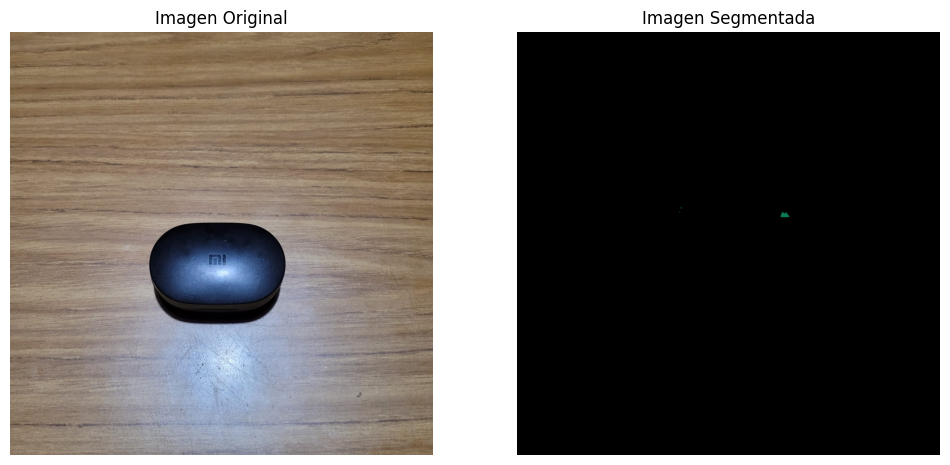

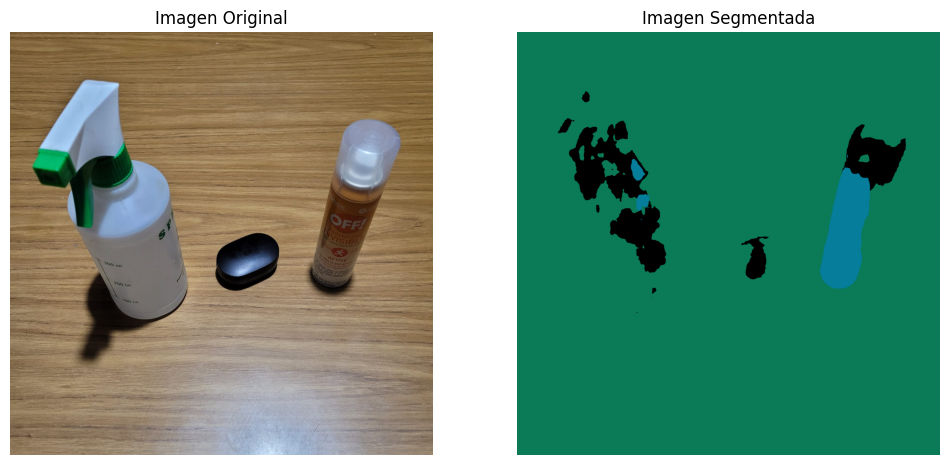

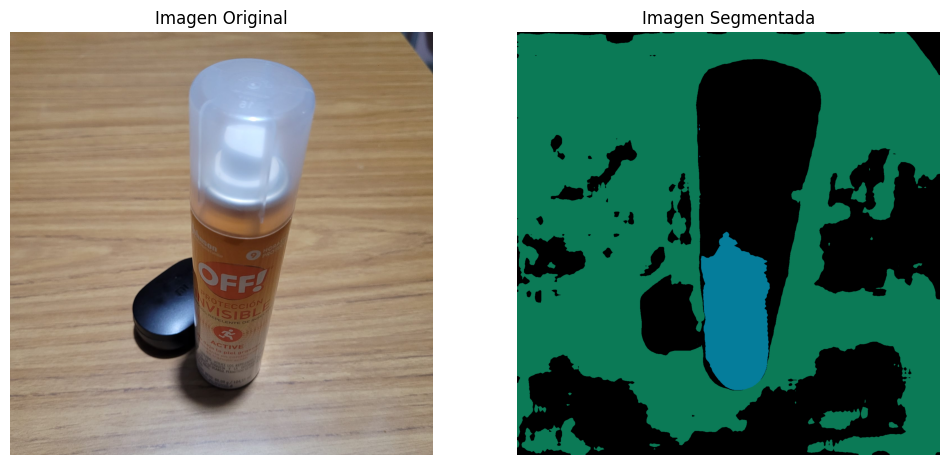

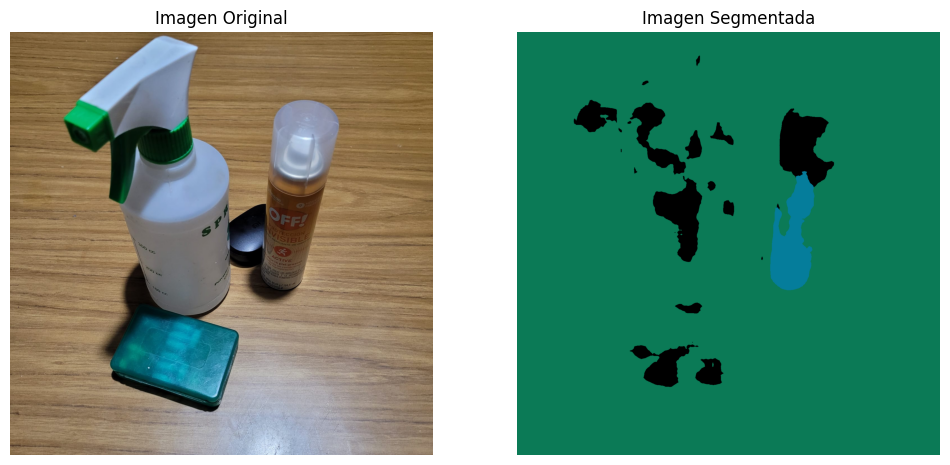

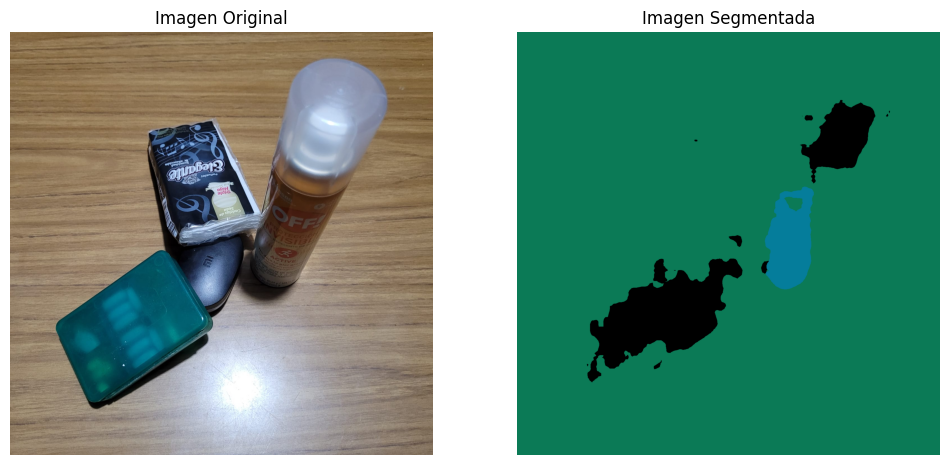

In [13]:
for imagen in imagenes:
  DeepLabV3(imagen)

El modelo no rinde eficientemente, ya que no es capaz de segmentar los objetos, sino que sólo detecta parte o nada de ellos.

# YoloV8 (Ultralytics)

A continuación, probaré el modelo Yolov8.

In [14]:
!yolo task=segment mode=predict model=yolov8s-seg.pt conf=0.25 source='https://media.roboflow.com/notebooks/examples/dog.jpeg' save=true
model = YOLO("yolov8m-seg.pt") # Cargar el modelo YOLOv8 con capacidad de segmentación

100% 22.8M/22.8M [00:00<00:00, 126MB/s] 
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv8s-seg summary (fused): 195 layers, 11810560 parameters, 0 gradients, 42.6 GFLOPs

100% 104k/104k [00:00<00:00, 41.7MB/s]
image 1/1 /content/dog.jpeg: 640x384 1 person, 1 car, 1 dog, 1 backpack, 1 handbag, 564.7ms
Speed: 5.5ms preprocess, 564.7ms inference, 13.0ms postprocess per image at shape (1, 3, 640, 384)
Results saved to runs/segment/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


100%|██████████| 52.4M/52.4M [00:00<00:00, 152MB/s]


In [15]:
def YoloV8(imagen):
    '''Recibe una imagen y segmenta los objetos en ella según el modelo YoloV8'''
    results = model.predict(imagen) # Realizar predicciones en la imagen
    result = results[0] # Seleccionar el primer resultado (en caso de que haya varios)

    img = Image.open(imagen)

    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    axs[0].imshow(img)
    axs[0].set_title('Imagen Original')
    axs[0].axis('off')

    img_segmentada = img.copy()
    draw = ImageDraw.Draw(img_segmentada)

    for box in result.boxes:

        x1, y1, x2, y2, conf, cls = box.data[0] # coordenadas del bounding box y clase
        label = result.names[int(cls)]  # result.names contiene los nombres de las clases
        draw.rectangle([x1, y1, x2, y2], outline=(0, 255, 0), width=2)
        text = f"{label} {conf:.2f}"
        draw.text((x1, y1), text, fill=(0, 255, 0))

    masks = result.masks # máscaras del resultado

    for mask in masks:
        # Convertir la máscara a un array numpy y obtener el polígono
        mask_data = mask.data[0].numpy()
        polygon = mask.xy[0]

        # Dibujar el polígono correspondiente a cada máscara en la imagen segmentada
        polygon_list = [(p[0], p[1]) for p in polygon]
        draw.polygon(polygon_list, outline=(255, 0, 0), width=3)

    axs[1].imshow(img_segmentada)
    axs[1].set_title('Imagen Segmentada')
    axs[1].axis('off')
    plt.show()

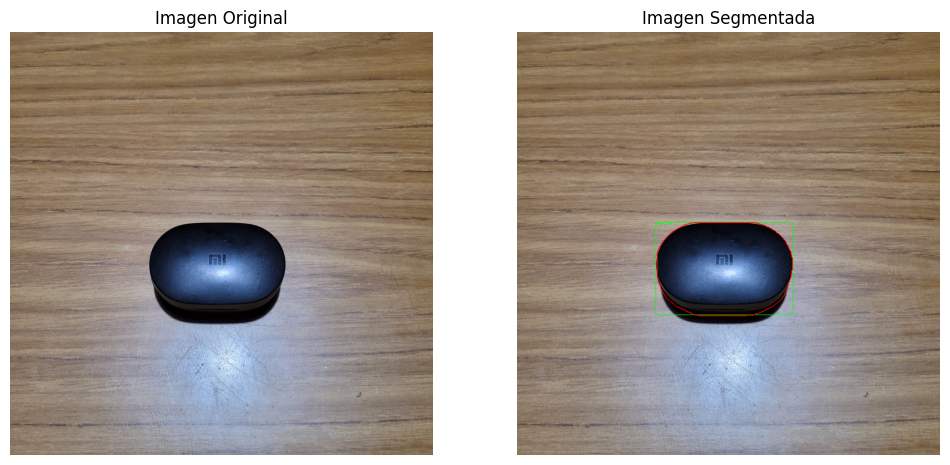

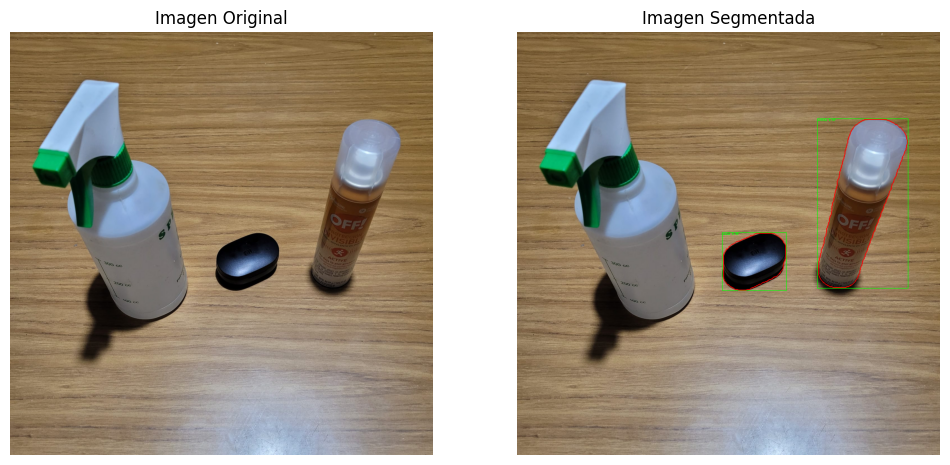

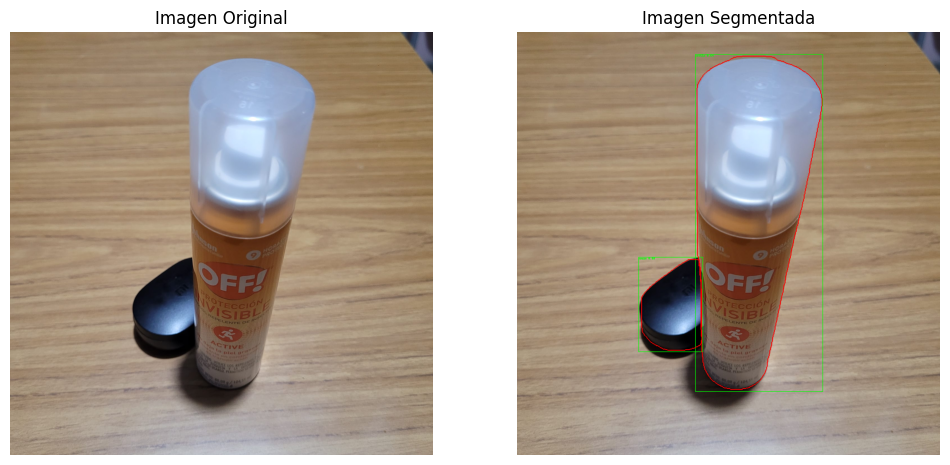

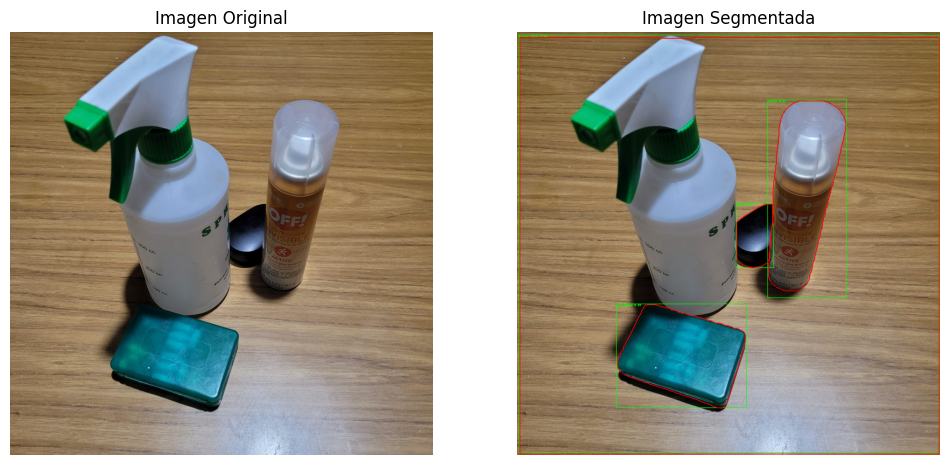

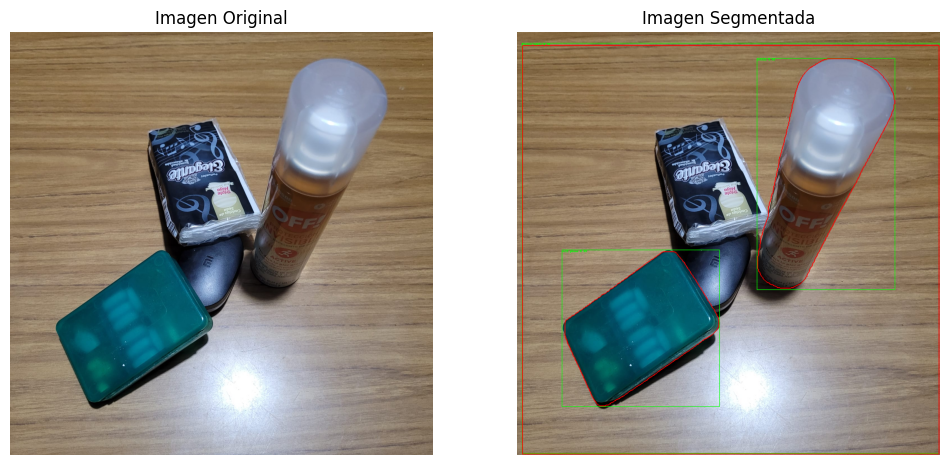

In [16]:
for imagen in imagenes:
    YoloV8(imagen)

YoloV8 es capaz de segmentar los objetos correctamente. Si bien las etiquetas no se logran visualizar, no espero que las haya categorizado bien ya que, como dije en un modelo anterior, no elegí objetos comunes.

# SAM

El último modelo que probé es SAM. Para ello, comencé descargando el modelo y definiendo dos funciones: '**show_anns**', la cual permite realizar la segmentación del modelo, y '**sam**' que se encarga de la aplicación del mismo y la visualización de los resultados.

In [17]:
%%capture
!{sys.executable} -m pip install opencv-python matplotlib
!{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'
!{sys.executable} -m pip install -q jupyter_bbox_widget roboflow dataclasses-json supervision
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

In [18]:
def show_anns(anns):
    '''Función que permite realizar la segmentación para el modelo SAM'''
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)

In [19]:
def sam(imagen):
    '''Recibe una imagen y realiza la segmentación según SAM'''
    sys.path.append("..")
    # Cargar la imagen
    image = cv2.imread(imagen)
    # new_width = int(image.shape[1] / 2)
    # new_height = int(image.shape[0] / 2)
    # image = cv2.resize(image, (new_width, new_height), interpolation=cv2.INTER_AREA)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # imagen original
    plt.figure(figsize=(5,5))
    plt.imshow(image)
    plt.axis('off')
    plt.show()

    sam_checkpoint = "sam_vit_h_4b8939.pth"
    model_type = "vit_h"

    device = "cpu"

    sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
    sam.to(device=device)

    mask_generator = SamAutomaticMaskGenerator(sam)

    masks = mask_generator.generate(image)

    # imagen segmentada
    plt.figure(figsize=(10,10))
    plt.imshow(image)
    show_anns(masks)
    plt.axis('off')
    plt.show()

Como la ejecución se hizo demasiado lenta, decidí mostrar el resultado de aplicar este modelo en únicamente dos imágenes.

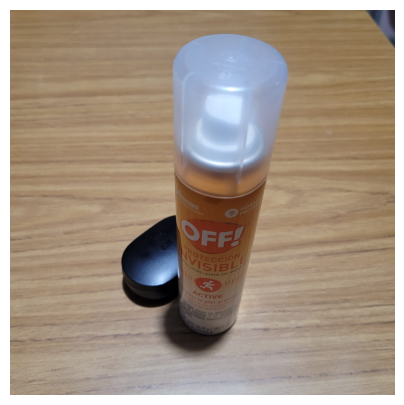

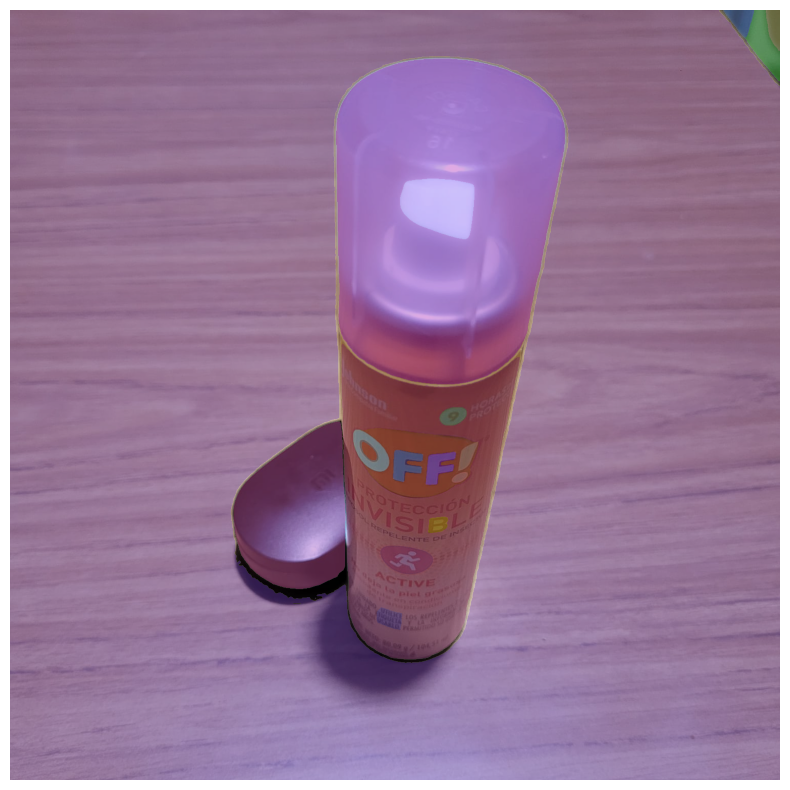

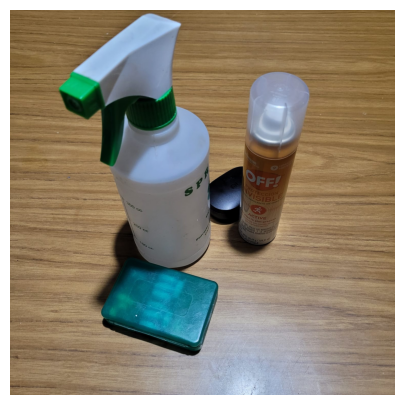

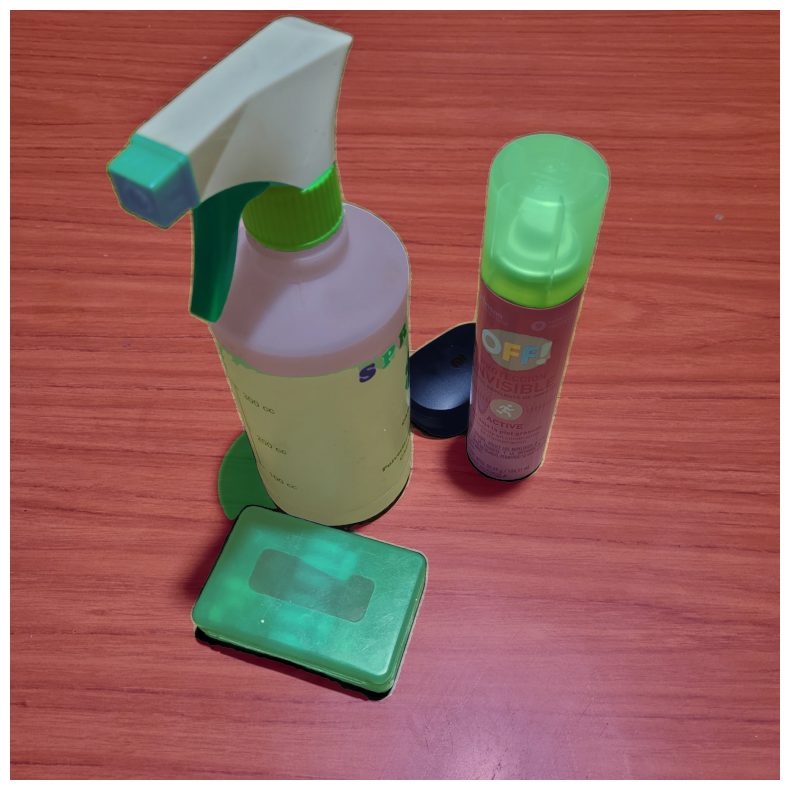

In [20]:
for imagen in imagenes[2:4]:
  sam(imagen)

SAM no sólo logra segmentar correctamente los objetos, sino que también detecta letras y detalles en los mismos. Sin embargo, su ejecución es bastante lenta. En mi caso, que no cuento con GPU, demoró aproximadamente 25 minutos en procesar dos imágenes.

# Conclusiones

En este ejercicio, evalué cinco técnicas distintas de segmentación de objetos: Watershed, PointRend Resnet50, DeepLabV3, YoloV8 y SAM. Estas técnicas se aplicaron a cinco imágenes diferentes tomadas en mi casa, donde algunos objetos estaban solapados y otros no.

La primera técnica, Watershed, no arrojó buenos resultados, como era de esperar. Aunque su ejecución fue rápida, su rendimiento fue muy malo, especialmente al enfrentarse a sombras y reflejos en las imágenes. Ni siquiera logró buenos resultados en la imagen más sencilla, donde se encontraba la caja de auriculares sola.

PointRend mostró un buen rendimiento al segmentar objetos incluso cuando estaban solapados. Aunque no identificó correctamente los objetos, lo cual tiene sentido ya que no utilicé objetos comunes (manzana, celular, libro), su rapidez de ejecución fue una ventaja significativa.

DeepLabV3 no cumplió con las expectativas, ya que en la mayoría de los casos no detectó ningún objeto, excepto en una ocasión donde identificó la forma de un objeto (el aerosol de off) pero no su contorno definido. Ni siquiera pudo localizar correctamente la ubicación del objeto más simple, la caja de auriculares.

Luego, YoloV8 logró segmentar correctamente los objetos, incluso cuando estaban solapados, y proporcionó un bounding box con la etiqueta correspondiente para cada uno. Nuevamente, no esperaba una identificación precisa de los objetos debido a lo explicado anteriormente.

Por último, Sam arrojó excelentes resultados en la segmentación, ya que no sólo detectó los objetos, sino también detalles de los mismos. Sin embargo, su punto negativo es que su ejecución fue extremadamente lenta.

En conclusión, a la hora de elegir un modelo de segmentación es muy importante tener en cuenta varias cosas: la exigencia a la hora de segmentar, sobre todo si hay solapamiento, la capacidad de etiquetar objetos correctamente y la velocidad de ejecución.

Para este caso de imágenes particulares, considero que el mejor rendimiento en cuanto a velocidad y resultados se logró con PointRend, pero si nos interesara conocer la clase de los objetos, YoloV8 es una muy buena opción.